<a href="https://colab.research.google.com/github/bankijey/IBM-DS-Capstone-Project/blob/main/Airbnb_berlin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Searching for the right Airbnb listing

Sharing economy is currently a major global trend. One popular example of sharing economy is Airbnb, which offers apartment owners an opportuinity to make quick cashflows from their properties and visitors a competitive alternative to hotels.

Currently due to travel restrictions, a lot of tourists cannot wait for the times when they can freely plan their holidays. With that in mind, I decided to explore one of the most trending topics in tourism. Airbnb

In this notebook, we examine Airbnb listings in Berlin and using clustering algorithims, we cluster listings based on prices, popularity and popular locations around them.

In [1]:
%load_ext google.colab.data_table

In [2]:
%unload_ext google.colab.data_table

## Import packages

 Along with the common data analysis packages, some necessary packages for this project are imported. These includes the Geopandas libraries for managing geographic data, geopy for coordinates and Folium for interactive maps.

In [3]:
import numpy as np 
import pandas as pd # library for data analsysis
import json # library to handle JSON files
import io
# Geographical libraries
try:
    import geopy
    from geopy.geocoders import Nominatim  # convert an address into latitude and longitude values
except:
    !conda install -c conda-forge geopy --yes
    import geopy
    from geopy.geocoders import Nominatim


geopy.geocoders.options.default_user_agent = 'my_app/banki'
geopy.geocoders.options.default_timeout = 7
from geopy.extra.rate_limiter import RateLimiter

try:
  import geopandas as gpd
except:
  !pip install geopandas
  import geopandas as gpd

from shapely.geometry import Point, Polygon

# Web Scraping
import requests # library to handle requests
from bs4 import BeautifulSoup # this module helps in web scrapping.
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import folium # map rendering library
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
import seaborn as sns # for statistical analysis
%matplotlib inline

# Import Clustering algorithms
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

print('Package load: Successful')

Package load: Successful


A function to get the cordinates of a passed location is created. This would be used throughout this notebook

In [4]:
def getCoord(address):
    
    '''Collect an address and define an agent
    Return the longitude and latitute'''
    try:
      geolocator = Nominatim()
      location = geolocator.geocode(address)
      return location.latitude,  location.longitude
    except:
      return None

Next, we define the authentication data that would be used to access the Foursquare API for searching locations

In [5]:
#@title Foursquare credential
CLIENT_ID = 'B3H1JSMBFGKWPLB10JP50SLDK2HWEDEXDSTMIQPQUDWJXK3Y' #  Foursquare ID
CLIENT_SECRET = '2L4IYKBOGM5SWE0QQQRFDWPCIIKWHKAIBTYGSWKCLYTEV041' #  Foursquare Secret
ACCESS_TOKEN = "HBXF3JFTMRLJXACINCLJF0YYG35TV4Y4F3FDFFBR4LM31QVS" #  FourSquare Access Token
VERSION = '20180604'

## AIRBNB Listings Data
Luckyily, detailed data on Airbnb listings are available from the [Inside Airbnb](http://insideairbnb.com/get-the-data.html) website. The first step is to download the data for the listings.

#### Download Listings


The csv file of the Airbnb listings in berlin is downloaded using the pandas read_csv method.

In [6]:
url="http://data.insideairbnb.com/germany/be/berlin/2021-02-20/visualisations/listings.csv"
s=requests.get(url).content
listings = pd.read_csv(io.StringIO(s.decode('utf-8')))
listings

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2015,Berlin-Mitte Value! Quiet courtyard/very central,2217,Ion,Mitte,Brunnenstr. Süd,52.53454,13.40256,Entire home/apt,52,5,134,2020-09-26,2.26,6,179
1,3176,Fabulous Flat in great Location,3718,Britta,Pankow,Prenzlauer Berg Südwest,52.53500,13.41758,Entire home/apt,90,62,147,2021-01-01,1.03,1,342
2,3309,BerlinSpot Schöneberg near KaDeWe,4108,Jana,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,Private room,29,7,27,2019-05-31,0.29,1,364
3,6883,Stylish East Side Loft in Center with AC & 2 b...,16149,Steffen,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,Entire home/apt,79,7,135,2021-01-23,1.01,1,0
4,7071,BrightRoom with sunny greenview!,17391,BrightRoom,Pankow,Helmholtzplatz,52.54316,13.41509,Private room,33,1,293,2020-03-31,2.09,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19973,48227629,A Scene Of Dream,12149952,Donja,Pankow,Weißensee,52.55344,13.45867,Private room,24,28,0,NaN,NaN,3,358
19974,48229545,Wu Zhao & Zen,12149952,Donja,Pankow,Weißensee,52.55420,13.45722,Private room,20,30,0,NaN,NaN,3,358
19975,48238525,★ Best Central Loft Apartment Gendarmenmarkt ★,16472922,Sandra,Mitte,Regierungsviertel,52.51293,13.39342,Entire home/apt,164,3,0,NaN,NaN,8,95
19976,48241624,Spacious Apartment in West Berlin,389233876,Paylag,Charlottenburg-Wilm.,Neue Kantstraße,52.50168,13.29804,Entire home/apt,64,21,0,NaN,NaN,1,71


Looks good. Next, we select only necessary columns. These include information on location and some details that are usually important while searching for accomodation. The cost of course along with the popularity (measured with the number of reviews) and the minimum number of nights.

After that, the column types are converted automatically using the pandas `convert_dtypes()` method

In [7]:
### HANDLING MISSSING VALUES
clmns = ['id', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price', 'number_of_reviews',
       'minimum_nights', 'last_review',
       'reviews_per_month']

data = listings[clmns]
df = data.convert_dtypes()
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19978 entries, 0 to 19977
Data columns (total 11 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   19978 non-null  Int64  
 1   neighbourhood_group  19978 non-null  string 
 2   neighbourhood        19978 non-null  string 
 3   latitude             19978 non-null  float64
 4   longitude            19978 non-null  float64
 5   room_type            19978 non-null  string 
 6   price                19978 non-null  Int64  
 7   number_of_reviews    19978 non-null  Int64  
 8   minimum_nights       19978 non-null  Int64  
 9   last_review          15868 non-null  string 
 10  reviews_per_month    15868 non-null  float64
dtypes: Int64(4), float64(3), string(4)
memory usage: 1.8 MB


Apparently, some listings have no reviews whatsoever as shown by the null values in the `last_review` and `reviews_per_month` columns. However, there is still a lot of listings (more than 15 k). So we drop those rows.





In [8]:
df.dropna(axis = 0, inplace = True)

That's still quite a lot of listings. Therefore, it's neccessary to do some simple analysis on the numerical data, to figure out the distribution of the data and find possible rows to drop.

### Exploratory analysis


First, we use the `pd.describe()` method to summarise the distribution of the listings price, number of reviews per month and minimum nights. 


In [9]:
df.describe().drop(columns = ['id',  'latitude', 'longitude'])

,price,number_of_reviews,minimum_nights,reviews_per_month
count,15868.000000,15868.000000,15868.000000,15868.000000
mean,66.981535,27.619738,7.501323,0.688556
std,87.380799,52.327565,30.995352,1.152330
min,8.000000,1.000000,1.000000,0.010000
25%,35.000000,3.000000,2.000000,0.100000
50%,50.000000,7.000000,3.000000,0.270000
75%,79.000000,26.000000,4.000000,0.780000
max,4000.000000,618.000000,1124.000000,49.130000


Looking at the above table, we see a chance for further wrangling. 75% of the listings have minimum nights of 4 nights which sounds more like a full house rental than Airbnb. 

According to [Statista](https://www.statista.com/statistics/579456/average-holiday-stays-by-united-kingdom-uk-residents/), the average Britons spent an average of 8.9 days on holiday abroad. So we make this figure round by filtering the data to just listings with 10 minimum nights requirements and below.

Furthermore, there is no guarantee that all listings would be currently active. Taking that into consideration, we drop listings with which have last reviews before 2019




In [10]:
df = df[(df['last_review'] >= '2019-01-01') & (df['minimum_nights'] < 11)].reset_index(drop = True)
# df = df[df['minimum_nights'] < 11].reset_index(drop = True)
df.shape

(10456, 11)

Wow that's about 50% of the listings gone. That does narrow things down a bit. Now lets look at our remaining listings

## Geo Visualization

Fir to get an overview, we create a heatmap of the whole distribution of our selected vlistings across berlin.

In [11]:
from folium import plugins
from folium.plugins import HeatMap
brln_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)

data_loc = df[['latitude','longitude']].values
HeatMap(data = data_loc.tolist(), radius=10, max_zoom=12).add_to(brln_map)
# brln_map

from folium import plugins

# let's start again with a clean copy of the map of San Francisco
# airbnb_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)

# instantiate a mark cluster object for the incidents in the dataframe
lists = plugins.MarkerCluster().add_to(brln_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(df.latitude, df.longitude, df.neighbourhood):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(lists)

brln_map

We notice a concerntration of listings in the middle of the city. 

The heatmap doesnt actually clearly show how the listings differ according to the Neighbourhoods (Stadtvierteil) and Districts (Bezirks) in Berlin. For that we use a GeoJson file and foliums chlorpeth plug in.

First we download the GeoJSON file for berlin using Geopandas

In [12]:
# Importing the Berlin districts and quarters boundary GeoJSON file
geo_url = 'http://data.insideairbnb.com/germany/be/berlin/2021-02-20/visualisations/neighbourhoods.geojson'
s=requests.get(url).content
gdf = gpd.read_file(geo_url)
gdf.head()

,neighbourhood,neighbourhood_group,geometry
0,Blankenfelde/Niederschönhausen,Pankow,"MULTIPOLYGON (((13.41191 52.61487, 13.41183 52..."
1,Helmholtzplatz,Pankow,"MULTIPOLYGON (((13.41405 52.54929, 13.41422 52..."
2,Wiesbadener Straße,Charlottenburg-Wilm.,"MULTIPOLYGON (((13.30748 52.46788, 13.30743 52..."
3,Schmöckwitz/Karolinenhof/Rauchfangswerder,Treptow - Köpenick,"MULTIPOLYGON (((13.70973 52.39630, 13.70926 52..."
4,Müggelheim,Treptow - Köpenick,"MULTIPOLYGON (((13.73762 52.40850, 13.73773 52..."


Next group the listings according to neighbourhoods, and the using the folium choropleth plugin, we generate maps showing the median price and number of reviews per month for the neighbourhoods

In [13]:
sv = pd.DataFrame(df.groupby(['neighbourhood']).size())
sv.rename(columns={0: 'number_of_listings'}, inplace=True)
sv['median_price'] = df.groupby('neighbourhood').price.median().values
sv['median_reviews'] = df.groupby('neighbourhood').number_of_reviews.median().values
# sv['mean_price'] = df.groupby('neighbourhood').price.mean().values
sv.reset_index(inplace= True)


brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'number_of_listings'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Number of Listings'
)

# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


In [14]:
brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 11)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'median_reviews'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlGnBu', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Median number of reviews'
)

# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


The dark patches show regions with listings that to fit our criteria. We also create a map for prices and popularity

In [15]:

brlq_map = folium.Map(location = getCoord('Berlin'), zoom_start = 10)
brlq_map.choropleth(
    geo_data='berlin_neighbourhoods.geojson',
    data=sv,
    columns=['neighbourhood', 'median_price'],
    key_on='feature.properties.neighbourhood',
    fill_color='YlOrRd', 
    fill_opacity=0.8, 
    line_opacity=0.3,
    legend_name='Airbnb prices'
)

# display map
brlq_map

/usr/local/lib/python3.7/dist-packages/folium/folium.py:426: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


Good thing the areas with the most listings don't have the highest prices for us

## ! Get Nearby venues of AirBnB listings

Now we have our datasets of listings in Berlin, we now utilize the Fourquare API to get the type of venues around our listings. Using this information, we can easily narrow down our search to areas with certain venues present

In [16]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [17]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):

  ''' Takes in a dataframe of coordinates and entities within a specified radius
      returns the names, categories and coordinates of venues around the location'''

  venues_list=[]
  for name, lat, lng in zip(names, latitudes, longitudes):
#         print(name)
      
      # create the API request URL
      url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
          CLIENT_ID, 
          CLIENT_SECRET, 
          VERSION, 
          lat, 
          lng, 
          radius, 
          LIMIT)
          
      # make the GET request
      try:
        results = requests.get(url).json()["response"]['groups'][0]['items']
        # print('{} | Status code: {} | Radius: {}'.format(name, results['response']['suggestedRadius']))

        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
      except:
        None
      
  nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
  nearby_venues.columns = ['Neighbourhood', 
                'Neighbourhood Latitude', 
                'Neighbourhood Longitude', 
                'Venue', 
                'Venue Latitude', 
                'Venue Longitude', 
                'Venue Category']
  
  return(nearby_venues)

In [18]:
# LIMIT = 100
# AB_venues = getNearbyVenues(names=df['id'],
#                                    latitudes=df['latitude'],
#                                    longitudes=df['longitude'],radius=500
#                                   )

# AB_venues.to_csv('ABs_venues.csv')

## CLUSTERING

For clustering, we are relyinf on a K-Means algorithm which works with numerical data. However, we have one categorical variable (room type) which has four unique types

In [19]:
df.room_type.value_counts()

Entire home/apt    5874
Private room       4292
Shared room         155
Hotel room          135
Name: room_type, dtype: Int64

Most of the listings are either entire apartments or private rooms.

We apply One hot encoding to the categorical data. This is achieved using the pd.get_dummies() method.



In [20]:
dummies = pd.get_dummies(df.room_type, prefix='', prefix_sep='')

df = pd.concat([df, dummies], axis=1)
df.drop('room_type', axis=1, inplace=True)

df.head()

,id,neighbourhood_group,neighbourhood,latitude,longitude,price,number_of_reviews,minimum_nights,last_review,reviews_per_month,Entire home/apt,Hotel room,Private room,Shared room
0,2015,Mitte,Brunnenstr. Süd,52.53454,13.40256,52,134,5,2020-09-26,2.26,1,0,0,0
1,3309,Tempelhof - Schöneberg,Schöneberg-Nord,52.49885,13.34906,29,27,7,2019-05-31,0.29,0,0,1,0
2,6883,Friedrichshain-Kreuzberg,Frankfurter Allee Süd FK,52.51171,13.45477,79,135,7,2021-01-23,1.01,1,0,0,0
3,7071,Pankow,Helmholtzplatz,52.54316,13.41509,33,293,1,2020-03-31,2.09,0,0,1,0
4,9991,Pankow,Prenzlauer Berg Südwest,52.53303,13.41605,180,8,6,2020-01-04,0.12,1,0,0,0


To spread the importance to all continous features, we need to scale them. For this, we use scikit-learn’s MinMaxScaler as the feature matrix is a mix of binary and continuous features.

In [21]:
from sklearn.preprocessing import MinMaxScaler
cont_clmns = df.describe().drop(columns = ['id', 'latitude', 'longitude']).columns
cont_data = df[cont_clmns]
mms = MinMaxScaler()
mms.fit(cont_data)
cont_data_transformed = mms.transform(cont_data)
cont_data_transformed
kdata = pd.DataFrame(cont_data_transformed, columns=cont_clmns )
kdata['id'] = df['id']
kdata

,price,number_of_reviews,minimum_nights,reviews_per_month,Entire home/apt,Hotel room,Private room,Shared room,id
0,0.014381,0.215559,0.444444,0.045223,1.0,0.0,0.0,0.0,2015
1,0.006689,0.042139,0.666667,0.005093,0.0,0.0,1.0,0.0,3309
2,0.023411,0.217180,0.666667,0.019760,1.0,0.0,0.0,0.0,6883
3,0.008027,0.473258,0.000000,0.041760,0.0,0.0,1.0,0.0,7071
4,0.057191,0.011345,0.555556,0.001630,1.0,0.0,0.0,0.0,9991
...,...,...,...,...,...,...,...,...,...
10451,0.034448,0.000000,0.111111,0.019556,1.0,0.0,0.0,0.0,47920604
10452,0.010368,0.000000,0.000000,0.019556,0.0,0.0,1.0,0.0,47949902
10453,0.017057,0.000000,0.111111,0.019556,1.0,0.0,0.0,0.0,48062964
10454,0.007023,0.000000,0.444444,0.019556,0.0,0.0,1.0,0.0,48074103


#### Load venues and convert to One Hot

Now to some serious stuff. We try to get the venues around the Airbnb listings. This requires the powerful Foursquare places API. Here we find venues around a 500m radius of each listing.

In [22]:
try:
  # AB_venues = pd.read_csv('ABs_venues.csv')
  AB_venues = pd.read_csv('ABs_venues (1).csv')
except:
  LIMIT = 200
  airbnb_venues = getNearbyVenues(names=df['id'],
                                    latitudes=df['latitude'],
                                    longitudes=df['longitude'],radius=500
                                    )

  airbnb_venues.to_csv('ABs_venues.csv')
  AB_venues = pd.read_csv('ABs_venues.csv')
AB_venues.drop(columns=['Unnamed: 0'], inplace=True)
AB_venues.rename(columns={'Neighbourhood':'listing_id'},inplace = True)
AB_venues

,listing_id,Neighbourhood Latitude,Neighbourhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,2015,52.53454,13.40256,W - Der Imbiss,52.534230,13.405117,Vegetarian / Vegan Restaurant
1,2015,52.53454,13.40256,Spielplatz im Weinbergspark,52.533113,13.403042,Playground
2,2015,52.53454,13.40256,Zionskirche,52.534342,13.403888,Church
3,2015,52.53454,13.40256,Weinerei Forum,52.533589,13.402761,Wine Bar
4,2015,52.53454,13.40256,Alimentari,52.534069,13.402112,Italian Restaurant
...,...,...,...,...,...,...,...
236615,27346455,52.49902,13.41534,terra,52.494926,13.414642,Italian Restaurant
236616,27346455,52.49902,13.41534,milchmädchen cafe,52.494796,13.415575,Coffee Shop
236617,27346455,52.49902,13.41534,Pirata Patata,52.497120,13.416887,Bar
236618,27346455,52.49902,13.41534,Backhaus Admiral,52.496434,13.415901,Bakery


Now we have our venues, for it to be useful, it is necessary to apply one hot enconding on the results. The next function takes the data of the venue and returns a data frame with rows of each listing and columns made up of all unique categories and the frequencies in our venues data.

In [23]:
# one hot encoding
def OneHotArBnB(venues):
    AB_onehot = pd.get_dummies(venues[['Venue Category']], prefix="", prefix_sep="")

    # add id column back to dataframe
    AB_onehot['listing_id'] = AB_venues['listing_id'] 

    # move neighborhood column to the first column
    fixed_columns = [AB_onehot.columns[-1]] + list(AB_onehot.columns[:-1])
    AB_onehot = AB_onehot[fixed_columns]

    print('Original Shape: {}'.format(AB_onehot.shape))
    
    AB_grouped = AB_onehot.groupby('listing_id').mean().reset_index()
    print('Grouped Shape: {}'.format(AB_grouped.shape))

    return AB_grouped

In [24]:
AB_grouped = OneHotArBnB(AB_venues)
AB_grouped.head()

Original Shape: (236620, 440)
Grouped Shape: (4991, 440)


,listing_id,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Alternative Healer,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Bathing Area,Bavarian Restaurant,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,...,Tennis Court,Tennis Stadium,Thai Restaurant,Theater,Theme Park Ride / Attraction,Theme Restaurant,Thrift / Vintage Store,Tibetan Restaurant,Tour Provider,Tourist Information Center,Toy / Game Store,Track,Trail,Train Station,Tram Station,Trattoria/Osteria,Tree,Tunnel,Turkish Home Cooking Restaurant,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vehicle Inspection Station,Venezuelan Restaurant,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Watch Shop,Waterfall,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio,Zoo,Zoo Exhibit
0,2015,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.030303,0.0,0.075758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.015152,0.015152,0.000000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.030303,0.060606,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.015152,0.000000,0.0,0.0,0.0,0.015152,0.0,0.0
1,3309,0.0,0.0,0.014706,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.014706,0.000000,0.0,0.0,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.000000,0.029412,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,...,0.0,0.0,0.029412,0.000000,0.0,0.0,0.014706,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.029412,0.000000,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0
2,6883,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.039474,0.000000,0.0,0.026316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.013158,...,0.0,0.0,0.039474,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.065789,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.013158,0.0,0.0,0.0,0.013158,0.0,0.0
3,7071,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.010000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.050000,0.0,0.090000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.000000,0.000000,0.010000,...,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.01,0.0,0.0,0.0,0.0,0.010000,0.0,0.0,0.0,0.010000,0.000000,0.010000,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.0,0.0,0.020000,0.000000,0.0,0.0,0.0,0.010000,0.0,0.0
4,9991,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.028169,0.0,0.084507,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.014085,0.000000,0.014085,...,0.0,0.0,0.000000,0.014085,0.0,0.0,0.000000,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.042254,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.0,0.0,0.000000,0.0,0.0


Then, we combine the listing data and the nearby venues.

In [25]:
AB_grouped_clustering = AB_grouped.merge(kdata, left_on='listing_id', right_on='id').drop(['id'], 1)
AB_grouped_clustering

,listing_id,ATM,Accessories Store,Adult Boutique,Advertising Agency,Afghan Restaurant,African Restaurant,Alternative Healer,American Restaurant,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Austrian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Basketball Court,Bath House,Bathing Area,Bavarian Restaurant,Bay,Beach,Beach Bar,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,...,Tour Provider,Tourist Information Center,Toy / Game Store,Track,Trail,Train Station,Tram Station,Trattoria/Osteria,Tree,Tunnel,Turkish Home Cooking Restaurant,Turkish Restaurant,Vacation Rental,Vegetarian / Vegan Restaurant,Vehicle Inspection Station,Venezuelan Restaurant,Video Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Watch Shop,Waterfall,Waterfront,Whisky Bar,Wine Bar,Wine Shop,Wings Joint,Women's Store,Yemeni Restaurant,Yoga Studio,Zoo,Zoo Exhibit,price,number_of_reviews,minimum_nights,reviews_per_month,Entire home/apt,Hotel room,Private room,Shared room
0,2015,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.030303,0.0,0.075758,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.015152,0.015152,0.000000,...,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.030303,0.060606,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.015152,0.000000,0.0,0.0,0.0,0.015152,0.0,0.0,0.014381,0.215559,0.444444,0.045223,1.0,0.0,0.0,0.0
1,3309,0.0,0.0,0.014706,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.014706,0.000000,0.0,0.000000,0.0,0.014706,0.0,0.0,0.0,0.0,0.00,0.000000,0.029412,0.0,0.014706,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,...,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.029412,0.000000,0.014706,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.006689,0.042139,0.666667,0.005093,0.0,0.0,1.0,0.0
2,6883,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.039474,0.000000,0.0,0.026316,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.013158,...,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.065789,0.0,0.0,0.0,0.013158,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.013158,0.0,0.0,0.0,0.013158,0.0,0.0,0.023411,0.217180,0.666667,0.019760,1.0,0.0,0.0,0.0
3,7071,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.010000,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.050000,0.0,0.090000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.01,0.000000,0.000000,0.010000,...,0.0,0.0,0.01000,0.0,0.0,0.0,0.0,0.010000,0.0,0.0,0.0,0.010000,0.000000,0.010000,0.0,0.0,0.0,0.050000,0.0,0.0,0.0,0.0,0.000000,0.0,0.020000,0.000000,0.0,0.0,0.0,0.010000,0.0,0.0,0.008027,0.473258,0.000000,0.041760,0.0,0.0,1.0,0.0
4,9991,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.014085,0.0,0.0,0.0,0.0,0.000000,0.014085,0.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.028169,0.0,0.084507,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.014085,0.000000,0.014085,...,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.014085,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.042254,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.014085,0.0,0.0,0.0,0.000000,0.0,0.0,0.057191,0.011345,0.555556,0.001630,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4986,27304459,0.0,0.0,0.000000,0.0,0.0,0.010000,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.010000,0.0,0.000000,0.0,0.0,0.0,0.0,0.00,0.000000,0.030000,0.0,0.190000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.000000,0.000000,..

The N most common venues are then around each listing is then extracted in order to get an overview of the surroundings of each listing.

In [26]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [27]:
def CommonVenues(df):
    None
    indicators = ['st', 'nd', 'rd']
    # create columns according to number of top venues
    columns = df.columns[0]
    columns = [df.columns[0]]
    
    for ind in np.arange(num_top_venues):
        try:
            columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
        except:
            columns.append('{}th Most Common Venue'.format(ind+1))
            
    # create a new dataframe
    subs_venues_sorted = pd.DataFrame(columns=columns)
    subs_venues_sorted[subs_venues_sorted.columns[0]] = df[df.columns[0]]

    for ind in np.arange(df.shape[0]):
        subs_venues_sorted.iloc[ind, 1:] = return_most_common_venues(df.iloc[ind, :], num_top_venues)
    return subs_venues_sorted

In [28]:
num_top_venues = 10
AB_venues_sorted = CommonVenues(df = AB_grouped_clustering[AB_grouped.columns])
AB_venues_sorted

,listing_id,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,2015,Bar,Café,Vegetarian / Vegan Restaurant,Italian Restaurant,Coffee Shop,Park,Boutique,Bakery,Seafood Restaurant,Plaza
1,3309,Men's Store,Coffee Shop,Cocktail Bar,Café,Gay Bar,Falafel Restaurant,Hotel,Turkish Restaurant,Supermarket,Organic Grocery
2,6883,Café,Vegetarian / Vegan Restaurant,Coffee Shop,Middle Eastern Restaurant,Italian Restaurant,Thai Restaurant,Plaza,Falafel Restaurant,Bagel Shop,Pizza Place
3,7071,Café,Bar,Bakery,Vietnamese Restaurant,Pizza Place,Ice Cream Shop,Falafel Restaurant,Japanese Restaurant,Korean Restaurant,Doner Restaurant
4,9991,Bar,Coffee Shop,Hotel,Vietnamese Restaurant,Playground,Hostel,Bakery,Breakfast Spot,Cocktail Bar,Historic Site
...,...,...,...,...,...,...,...,...,...,...,...
4986,27304459,Bar,Café,Coffee Shop,Cocktail Bar,Italian Restaurant,Pizza Place,Lebanese Restaurant,Bakery,Pub,Bistro
4987,27308153,Café,Bar,Falafel Restaurant,Italian Restaurant,Coffee Shop,Beer Bar,Bakery,Vietnamese Restaurant,Trattoria/Osteria,Japanese Restaurant
4988,27319475,Italian Restaurant,Bakery,Vietnamese Restaurant,Pizza Place,Organic Grocery,Bar,Lottery Retailer,Restaurant,Doner Restaurant,German Restaurant
4989,27346030,Coffee Shop,Bar,Italian Restaurant,Vegetarian / Vegan Restaurant,Café,Ice Cream Shop,Cocktail Bar,Restaurant,Hotel,Plaza


### K-Means Clustering

Now we attempt to create clusters of listings based on the venues and the numerical and categorical characteristics of the listings.

First we use the elbow method to find the optimum number of clusters.

The elbow method is one of the simplest methods for defining the number of clusters in K-Means clustering. It involves selecting the point where the slope of the curve decreases significantly.

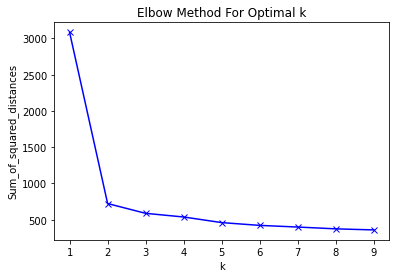

In [29]:
Sum_of_squared_distances = []
K = range(1,10)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(AB_grouped_clustering.drop('listing_id', 1))
    Sum_of_squared_distances.append(km.inertia_)

plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()



Results of the elbow chart suggest a classifying the data into two clusters.

In [30]:
# set number of clusters

k = 2
# Drop listing id
# AB_grouped_clustering = AB_grouped.merge(df_onehot, left_on='listing_id', right_on='id').drop(['id','listing_id'], 1)
# AB_grouped_clustering = AB_grouped.drop('listing_id', 1)
 
# run k-means clustering
kmeans = KMeans(n_clusters=k, random_state=0).fit(AB_grouped_clustering.drop('listing_id', 1))
# db = DBSCAN().fit(AB_grouped_clustering)
 
# check cluster labels generated for each row in the dataframe
print('Cluster labels: {}'.format(kmeans.labels_[0:150]))
# print('Cluster labels: {}'.format(db.labels_))
 
# Create dist plot!!!!!
# add clustering labels
city = 'Berlin'
try:
  AB_venues_sorted.drop(columns = 'Cluster Labels', inplace= True)
  AB_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

except:
  AB_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

    
AB_merged = df
 
# merge AB_grouped with AB_data to add latitude/longitude for each neighborhood
AB_merged = AB_merged.join(AB_venues_sorted.set_index('listing_id'), on='id')
 
print(AB_merged.shape)
 
# Drop NaN and convert cluster to int
AB_merged = AB_merged.dropna(axis = 0).reset_index(drop=True)
AB_merged['Cluster Labels']= AB_merged['Cluster Labels'].astype(int)
 
AB_merged.to_csv('{}_Clustered_AIRBNB_{}.csv'.format(k, city ))
 
print(AB_merged.shape)

Cluster labels: [0 1 0 1 0 0 0 0 0 0 0 1 1 1 1 1 0 1 0 1 0 0 0 0 1 0 1 0 1 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 1 0 1 0 0 1 1 0 0 0 0 0 0 0 1 0 0 0 0 0 0
 0 0 0 1 0 0 1 0 0 1 0 1 1 1 0 1 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1
 1 1 0 1 1 0 0 0 0 0 0 1 1 1 1 1 0 0 0 0 0 1 0 0 0 0 1 0 1 1 1 1 1 1 0 0 0
 0 0]
(10456, 25)
(4991, 25)


Looking into the clusers, we see that the listings have been grouped into cheaper possibly single rooms and more expensive entire apartments. This becomes useful in detecting the best listings based on the user's choices

In [31]:
agg_list= AB_merged.groupby(['Cluster Labels'])['price','Entire home/apt'].median()
agg_list

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


,price,Entire home/apt
Cluster Labels,,
0,79,1
1,36,0


Now we put this to a test. Imagine a user wants to search for listings in berlin, but would like to be within 500m distance of a Museum, a Bar and a Supermarket. 

We pass these as Inputs and then get a map of the listings available that suit these criteria.

In [32]:
cat_list = [ 'Museum', 'Bar', 'Supermarket']
selcted = AB_merged.iloc[:, 14:24]

for cat in cat_list:
  selcted = selcted[selcted.apply(lambda r: r.str.contains(cat, case=False).any(), axis=1)]
AB_merged.iloc[selcted.index]

,id,neighbourhood_group,neighbourhood,latitude,longitude,price,number_of_reviews,minimum_nights,last_review,reviews_per_month,Entire home/apt,Hotel room,Private room,Shared room,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1767,10266677,Mitte,Regierungsviertel,52.51273,13.38132,52,112,2,2020-03-07,1.83,0,0,1,0,1,Clothing Store,Hotel Bar,Plaza,Hotel,Italian Restaurant,Museum,Sporting Goods Shop,Bakery,Supermarket,Historic Site
1800,10664920,Mitte,Brunnenstr. Süd,52.53077,13.38589,129,24,7,2019-10-16,0.39,1,0,0,0,0,Hotel,Coffee Shop,Café,Italian Restaurant,Beer Bar,Supermarket,Breakfast Spot,Burger Joint,Science Museum,Schnitzel Restaurant
2358,14562079,Lichtenberg,Alt-Lichtenberg,52.51253,13.49278,90,128,2,2020-01-02,2.34,1,0,0,0,0,Supermarket,Bakery,Italian Restaurant,Salon / Barbershop,History Museum,Salad Place,Pharmacy,Lawyer,Smoke Shop,Train Station
2426,14974548,Mitte,Brunnenstr. Süd,52.53089,13.38558,170,28,6,2020-08-09,0.52,1,0,0,0,0,Hotel,Coffee Shop,Café,Italian Restaurant,Beer Bar,Supermarket,Breakfast Spot,Burger Joint,Science Museum,Schnitzel Restaurant
2474,15255651,Charlottenburg-Wilm.,Otto-Suhr-Allee,52.52096,13.30392,40,26,2,2020-11-08,0.50,0,0,1,0,1,Italian Restaurant,Supermarket,Café,Art Museum,Gym,Park,Farmers Market,Russian Restaurant,Bar,Bakery


Just five listings. Now we can view them on the map.

#### MApS

In [33]:
# create map
def ClusterMap(df, add, zoom_start, area):
    k = len(set(df['Cluster Labels'].tolist()))
    lati, longi = getCoord(add)
    map_ = folium.Map(location=getCoord(add), zoom_start=zoom_start)
#     map_ = folium.Map(location=[latitude, longitude], zoom_start=10)

# set color scheme for the clusters
    x = np.arange(k)
    ys = [i + x + (i*x)**2 for i in range(k)]
    colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
    rainbow = [colors.rgb2hex(i) for i in colors_array]

    # add markers to the map
    markers_colors = []
    for lat, lon, poi, price, cluster in zip(df['latitude'], df['longitude'], df[area],  df['price'].astype(int),  df['Cluster Labels'].astype(int)):
        # label = folium.Popup(str(poi) + ' : Cluster ' + str(cluster) + 'Price: '+str(price), parse_html=True)
        label = folium.Popup(str(poi)  + 'n\ Price ' + str(price), parse_html=True)
        folium.CircleMarker(
            [lat, lon],
            radius=5,
            popup=label,
            color=rainbow[cluster-1],
            fill=True,
            fill_color=rainbow[cluster-1],
            fill_opacity=0.7).add_to(map_)

#     lists = plugins.MarkerCluster().add_to(map_)

# # loop through the dataframe and add each data point to the mark cluster
#     for lat, lng in zip(df.latitude, df.longitude):
#         folium.Marker(
#             location=[lat, lng],
#             icon=None,
#         ).add_to(lists)

    return map_

In [34]:
mapa = ClusterMap(df = AB_merged.iloc[selcted.index], add = 'Berlin', zoom_start = 11, area = 'neighbourhood')
mapa

Accordingly, we find that two out of the five listings can sbe convinient on a budget. Personally I would be more interested with that at the city center (Regierungsviertel).

## Conclusion

We have been able to create a program that loops through Airbnb listings in berlin, group them into two clusters and then narrow the search based on nearby venues. 

There's still quite a lot of room for further development including trying out other cluster algorithms and incorparating additional data (like events nearby etc.)